# Maching learning - задача по отклику водителя такси на заказ

Импорт библиотек

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import math
import time
%matplotlib inline

## Загрузим данные

In [ ]:
data = pd.read_csv("taxi.csv")
data.sample(10)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
16260,358782,6,8,2337,67912,55.745608,37.579858,55.739505,37.566287,-1.000,-1.000,VIP+,private,1
52423,753981,5,1,5259,132417,55.415053,37.898173,55.410307,37.902451,-1.000,-1.000,Standard,business,0
94487,1028339,3,21,5269,823464,55.962323,37.407117,55.964892,37.413543,33.927,43.967,Standard,private,0
18442,214922,3,15,5794,271542,55.774060,37.589272,55.776858,37.586520,-1.000,-1.000,Standard,private,1
18772,643816,5,22,5286,695924,55.782860,37.595553,55.787245,37.600829,3.879,17.083,Economy,private,1
15710,125389,5,21,422,240671,55.681363,37.272015,55.673507,37.257816,4.299,12.333,Economy,private,0
43873,373315,3,22,591,752355,55.767693,37.584200,55.761860,37.579678,12.434,18.250,Standard,private,0
12735,509605,4,22,51,307114,55.752463,37.541338,55.751329,37.539052,-1.000,-1.000,Economy,business,1
90669,947648,2,12,3078,707446,55.685502,37.414330,55.685447,37.414240,-1.000,-1.000,Standard,business,1
93154,300732,5,1,1455,683858,55.414113,37.899470,55.410307,37.902451,64.562,72.517,Standard,private,0


In [ ]:
data.shape

(100000, 14)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
offer_gk                  100000 non-null int64
weekday_key               100000 non-null int64
hour_key                  100000 non-null int64
driver_gk                 100000 non-null int64
order_gk                  100000 non-null int64
driver_latitude           100000 non-null float64
driver_longitude          100000 non-null float64
origin_order_latitude     100000 non-null float64
origin_order_longitude    100000 non-null float64
distance_km               100000 non-null float64
duration_min              100000 non-null float64
offer_class_group         100000 non-null object
ride_type_desc            100000 non-null object
driver_response           100000 non-null int64
dtypes: float64(6), int64(6), object(2)
memory usage: 10.7+ MB


Число строк в датасете и число ненулевых элементов по всем строкам совпадают и равны 100000. Значит нет пропусков в датасете.  
Общее число признаков 14. Также видно, что у нас два признака не числового типа, это offer_class_group и ride_type_desc. Среди числовых признаков половина имеет целый тип и половина вещественный тип.

По умолчанию метод describe работает только с числовыми признаками. Включим в метод все признаки.

In [ ]:
data.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
offer_gk,100000,NaN,NaN,NaN,566219,325936,4,285555,565672,848720,1.13036e+06
weekday_key,100000,NaN,NaN,NaN,3.15986,2.05422,0,1,3,5,6
hour_key,100000,NaN,NaN,NaN,13.8278,7.3065,0,8,16,20,23
driver_gk,100000,NaN,NaN,NaN,3446.38,2038.74,14,1421,3506.5,5242,6806
order_gk,100000,NaN,NaN,NaN,460867,266065,18,229178,462420,690894,920344
driver_latitude,100000,NaN,NaN,NaN,55.7008,2.1359,-1,55.7087,55.7729,55.9607,56.1741
driver_longitude,100000,NaN,NaN,NaN,37.4923,1.45464,-1,37.4135,37.5337,37.6241,38.2805
origin_order_latitude,100000,NaN,NaN,NaN,55.7724,0.665985,-1,55.708,55.7726,55.962,56.3111
origin_order_longitude,100000,NaN,NaN,NaN,37.5416,0.467758,-1,37.4071,37.5325,37.6244,38.2436
distance_km,100000,NaN,NaN,NaN,18.3935,41.1293,-1,-1,10.4115,30.6653,5234.28


### **Опишем особенности каждого признака.**

1. **offer_gk** - **номер предложения**.

In [ ]:
data['offer_gk'].nunique()

100000

In [ ]:
max(data['offer_gk'])

1130355

Номер предложения уникальный, всегда разный. В датасете представлен с пропусками: начинается с номера **4** и заканчивается номером **1130355**. Максимальный номер предложения более чем в 10 раз превышает количество строк датасета. Возможно была предварительная выборка. 

2. **weekday_key** - **день недели**.

In [ ]:
data['weekday_key'].value_counts()

5    19284
6    15466
0    14411
4    13290
1    13089
2    12859
3    11601
Name: weekday_key, dtype: int64

Здесь особенностей нет, семь дней недели, всё верно. Но какому числу соответствует, к примеру, понедельник, не понятно. Самый загруженный день 5-й. Самый тихий на события день 3-й.

3. **hour_key** - **час**.

In [ ]:
data['hour_key'].value_counts()

23    8184
21    7398
22    6881
0     6646
20    6566
19    6369
18    5889
17    5028
16    4500
15    4249
14    3584
8     3550
1     3467
13    3355
9     3298
12    3169
11    2890
10    2840
7     2482
2     2275
4     2193
5     1809
3     1768
6     1610
Name: hour_key, dtype: int64

In [ ]:
hk_vc = data['hour_key'].value_counts()

In [ ]:
hk_vc[hk_vc > 5000] 

23    8184
21    7398
22    6881
0     6646
20    6566
19    6369
18    5889
17    5028
Name: hour_key, dtype: int64

In [ ]:
hk_vc[hk_vc < 2500] 

7    2482
2    2275
4    2193
5    1809
3    1768
6    1610
Name: hour_key, dtype: int64

Дело происходит по земному расписанию. :)  
Пиковая активность приходится на вечернее время и до полуночи включительно.  
От двух ночи до семи утра активность низкая.

4. **driver_gk** - **номер водителя**.

In [ ]:
data['driver_gk'].nunique()

439

Всего 439 водителей с номерами от 14 по 6806.

5. **order_gk** - **номер заказа**.

In [ ]:
data['order_gk'].nunique()

81435

Число заказов 'order_gk' меньше, чем число **уникальных** предложений 'offer_gk'.  
Посмотрим топ значений номеров заказов и минимум.

In [ ]:
data['order_gk'].value_counts()

853342    14
714527    13
761031    13
828548    12
180487    12
          ..
529767     1
361705     1
57063      1
782999     1
786432     1
Name: order_gk, Length: 81435, dtype: int64

Видно, что некоторым номерам заказа соответствует до 14 различных уникальных предложений. Но, для анализа данных лучше перевернуть предложение, то есть логику. Нескольким уникальным предложениям соответствует один **подтверждённый** номер заказа. Это кейс, когда стоит обратить внимание на данные.

К примеру:

In [ ]:
data[data['order_gk'] == 853342]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
23218,929594,5,23,4339,853342,55.966694,37.415752,55.962322,37.407117,7.718,16.7,Economy,private,0
23484,574355,5,23,801,853342,55.961051,37.415866,55.962322,37.407117,7.718,16.7,Economy,private,0
23651,394516,5,23,2236,853342,55.962323,37.407117,55.962322,37.407117,7.718,16.7,Economy,private,0
24326,609443,5,23,4600,853342,55.962324,37.407116,55.962322,37.407117,7.718,16.7,Economy,private,0
24651,726807,5,23,4804,853342,55.960693,37.415349,55.962322,37.407117,7.718,16.7,Economy,private,0
24926,1066357,5,23,4100,853342,55.961092,37.413188,55.962322,37.407117,7.718,16.7,Economy,private,0
25672,338185,5,23,1793,853342,55.962122,37.409464,55.962322,37.407117,7.718,16.7,Economy,private,0
26857,882098,5,23,668,853342,55.962427,37.409279,55.962322,37.407117,7.718,16.7,Economy,private,0
27009,937263,5,23,2381,853342,55.961857,37.414049,55.962322,37.407117,7.718,16.7,Economy,private,0
27502,16487,5,23,1060,853342,55.961859,37.407126,55.962322,37.407117,7.718,16.7,Economy,private,0


К примеру вот этот популярный случай. Видно, что некоторый пользователь услуг такси регулярно в одно и тоже время в определённый день недели пользуется услугами такси. Вызывает такси из одного и того же места по одному и тому же маршруту. Откликаются разные водители. И бинарный признак ответа водителя во всех случаях одинаков, это **0**.

In [ ]:
data[data['order_gk'] == 761031]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
23342,265825,5,23,4339,761031,55.966694,37.415752,55.961811,37.404706,18.047,20.0,Economy,private,0
23562,711507,5,23,801,761031,55.961046,37.415840,55.961811,37.404706,18.047,20.0,Economy,private,0
23991,96425,5,23,2236,761031,55.962323,37.407117,55.961811,37.404706,18.047,20.0,Economy,private,0
24490,97485,5,23,4600,761031,55.962324,37.407116,55.961811,37.404706,18.047,20.0,Economy,private,0
25294,832979,5,23,4100,761031,55.961092,37.413188,55.961811,37.404706,18.047,20.0,Economy,private,0
26237,35563,5,23,1793,761031,55.962122,37.409464,55.961811,37.404706,18.047,20.0,Economy,private,0
26925,94957,5,23,668,761031,55.962772,37.411633,55.961811,37.404706,18.047,20.0,Economy,private,0
27274,892306,5,23,2381,761031,55.961857,37.414049,55.961811,37.404706,18.047,20.0,Economy,private,0
28786,457488,5,23,1060,761031,55.961859,37.407126,55.961811,37.404706,18.047,20.0,Economy,private,0
30638,773006,5,23,5917,761031,55.961061,37.413291,55.961811,37.404706,18.047,20.0,Economy,private,0


In [ ]:
data[data['order_gk'] == 180487]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
13456,696861,3,2,2291,180487,55.962324,37.407116,55.964892,37.413543,-1.0,-1.0,Economy,business,0
16729,805719,3,2,4297,180487,55.965300,37.430250,55.964892,37.413543,-1.0,-1.0,Economy,business,1
25829,353184,3,2,1793,180487,55.964912,37.417926,55.964892,37.413543,-1.0,-1.0,Economy,business,0
27103,304733,3,2,2381,180487,55.961392,37.413817,55.964892,37.413543,-1.0,-1.0,Economy,business,0
27824,595302,3,2,1060,180487,55.961859,37.407126,55.964892,37.413543,-1.0,-1.0,Economy,business,0
31358,864694,3,2,6762,180487,55.964892,37.413543,55.964892,37.413543,-1.0,-1.0,Economy,business,0
38802,1093694,3,2,1421,180487,55.961179,37.413284,55.964892,37.413543,-1.0,-1.0,Economy,business,0
41544,1110320,3,2,1537,180487,55.962323,37.407114,55.964892,37.413543,-1.0,-1.0,Economy,business,0
60492,304235,3,2,975,180487,55.960537,37.413353,55.964892,37.413543,-1.0,-1.0,Economy,business,0
69590,27023,3,2,4490,180487,55.961926,37.409716,55.964892,37.413543,-1.0,-1.0,Economy,business,0


6. **driver_latitude** - **координата широты местонахождения водителя**.

In [ ]:
len(data[data['driver_latitude']==-1])

140

Дело происходит судя по координатам в Москве. Есть значения, когда данный параметр не отображён, не выявлен. Значение **-1**.

7. **driver_longitude** - **координата долготы местонахождения водителя**.

In [ ]:
len(data[data['driver_longitude']==-1])

140

Есть значения, когда данный параметр не отображён, не выявлен. Значение **-1**.  
Предположительно это одни и те же строчки, если рассматривать признаки 'driver_latitude' и 'driver_longitude'.  
Количество неопределённых значений: **140**.

**К п.п. 6 и 7**:

In [ ]:
len(data[data['driver_latitude']==-1][data['driver_longitude']==-1])

140

Да, одновременно соблюдаются **оба** условия.  
Следует **удалить эти строчки**, можно использовать **один** из атрибутов.

8. **origin_order_latitude** - **координата широты заказа**.

In [ ]:
len(data[data['origin_order_latitude']==-1])

13

9. **origin_order_longitude** - **координата долготы заказа**.

In [ ]:
len(data[data['origin_order_longitude']==-1])

13

В случае признаков 'origin_order_latitude' и 'origin_order_longitude'  
количество неопределённых значений: **13**.

**К п.п. 8 и 9**:

In [ ]:
len(data[data['origin_order_latitude']==-1][data['origin_order_latitude']==-1])

13

Да, одновременно соблюдаются **оба** условия.  
Следует **удалить эти строчки**, можно использовать **один** из атрибутов.

**К п.п. 6 и 7 и к п.п. 8 и 9**:

In [ ]:
len(data[data['driver_latitude']==-1][data['driver_longitude']==-1]
    [data['origin_order_latitude']==-1][data['origin_order_latitude']==-1])

0

Очевидно, что 140 строчек отличаются от 13 строчек.  
Две группы пар не определенных положений в датасете.  
**Удалить 153 строки!**

10. **distance_km** - **расстояние поездки в километрах**.

In [ ]:
len(data[data['distance_km']==-1])

26207

In [ ]:
statistics.median(data['distance_km'])

10.4115

In [ ]:
max(data['distance_km'])

5234.2829999999985

In [ ]:
data[data['distance_km'] > 100]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
1826,422630,5,23,5828,91211,55.431230,37.879535,55.410307,37.902451,107.034,89.017,Economy,private,0
1839,828651,5,23,5828,480884,55.427706,37.883566,55.415512,37.900245,106.194,86.283,Economy,private,0
2272,735915,1,2,6792,907132,55.415423,37.898428,55.410307,37.902451,132.380,127.483,Economy,private,1
2403,735017,1,18,6792,191503,55.418292,37.895247,55.410307,37.902451,105.626,98.417,Economy,private,0
2462,7256,6,23,6792,173018,55.415378,37.898375,55.410307,37.902451,108.081,92.083,Economy,private,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96579,674782,5,23,1126,332427,55.962987,37.413468,55.962322,37.407117,105.690,82.833,Economy,private,0
98133,288571,5,23,6302,332427,55.964894,37.413532,55.962322,37.407117,105.690,82.833,Economy,private,0
98134,891254,5,23,6302,332427,55.964894,37.413532,55.962322,37.407117,105.690,82.833,Economy,private,1
98851,214192,6,19,2442,110643,55.961225,37.413497,55.962322,37.407117,114.068,90.467,Economy,private,0


Количество неопределённых по расстоянию поездок: **26207**.  
Есть поездки **аномально** длинные по расстоянию. **175 строк** нужно удалить.

11. **duration_min** - **продолжительность поездки в минутах**.

In [ ]:
len(data[data['duration_min']==-1])

26207

In [ ]:
statistics.median(data['duration_min'])

19.7

In [ ]:
max(data['duration_min'])

3958.283

Количество неопределённых по расстоянию поездок: **26207**.  (Столько и для атрибута 'distance_km')
Есть поездки **аномально** продолжительные по времени. (Похоже, те, что и **аномально** длинные по расстоянию)

12. **offer_class_group** - **класс поездки**.

In [ ]:
data['offer_class_group'].value_counts()

Economy     48335
Standard    47288
Premium      1773
Delivery     1290
Kids          588
XL            464
VIP           225
VIP+           29
Test            8
Name: offer_class_group, dtype: int64

In [ ]:
len(data['offer_class_group'].value_counts())

9

Всего 9 классов поездки. Есть среди них тестовый и видно, что VIP и VIP+ заказывают редко. **Тестовые поездки** не относятся к рассматриваемой задаче (это или пробные заезды, или проверка системы) - **надо удалить**.

13. **ride_type_desc** - **тип поездки**.

In [ ]:
data['ride_type_desc'].value_counts()

private      91207
business      8533
affiliate      224
SMB             36
Name: ride_type_desc, dtype: int64

In [ ]:
len(data['ride_type_desc'].value_counts())

4

Всего 4 типа поездок.

14. **driver_response** - **ответ водителя на предложение о заказе**.

In [ ]:
data['driver_response'].value_counts()

0    50752
1    49248
Name: driver_response, dtype: int64

In [ ]:
data['driver_response'].value_counts()[0] + data['driver_response'].value_counts()[1]

100000

driver_response - бинарный признак ответа водителя на предложение о заказе (0 и 1)

In [ ]:
data.isnull().sum()

offer_gk                  0
weekday_key               0
hour_key                  0
driver_gk                 0
order_gk                  0
driver_latitude           0
driver_longitude          0
origin_order_latitude     0
origin_order_longitude    0
distance_km               0
duration_min              0
offer_class_group         0
ride_type_desc            0
driver_response           0
dtype: int64

### Посмотрим на корреляцию.

**Расчёт:**

In [ ]:
data.corr().round(2)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response
offer_gk,1.00,-0.00,-0.01,0.00,0.00,-0.00,-0.00,-0.01,-0.01,-0.00,-0.00,0.01
weekday_key,-0.00,1.00,0.05,0.01,0.00,-0.00,0.01,-0.01,0.01,-0.03,-0.03,0.04
hour_key,-0.01,0.05,1.00,-0.04,0.01,0.00,-0.01,0.01,-0.02,-0.02,-0.03,0.02
driver_gk,0.00,0.01,-0.04,1.00,-0.00,-0.03,-0.00,-0.03,0.04,-0.01,-0.00,0.02
order_gk,0.00,0.00,0.01,-0.00,1.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00
driver_latitude,-0.00,-0.00,0.00,-0.03,0.00,1.00,0.99,0.03,-0.04,0.01,0.02,-0.05
driver_longitude,-0.00,0.01,-0.01,-0.00,0.00,0.99,1.00,-0.00,0.02,0.01,0.02,-0.02
origin_order_latitude,-0.01,-0.01,0.01,-0.03,0.01,0.03,-0.00,1.00,0.86,-0.00,-0.01,-0.05
origin_order_longitude,-0.01,0.01,-0.02,0.04,0.00,-0.04,0.02,0.86,1.00,0.01,0.02,0.05
distance_km,-0.00,-0.03,-0.02,-0.01,0.00,0.01,0.01,-0.00,0.01,1.00,0.98,-0.14


**Визуализация:**

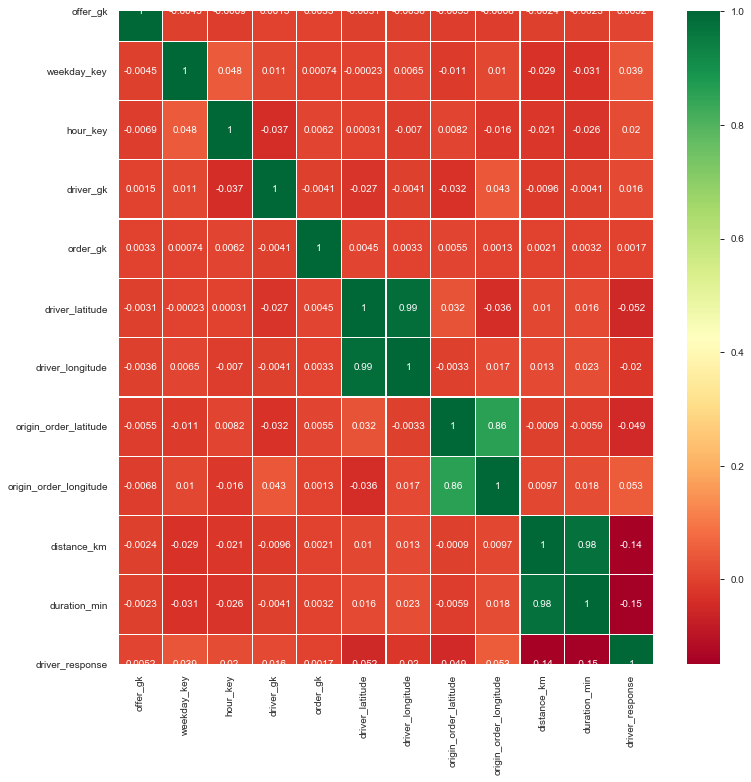

In [ ]:
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->матрица корреляций
# gcf() - получение текущей фигуры
fig=plt.gcf()
# set_size_inches() - установить размер фигуры
fig.set_size_inches(12,12)
plt.show()

Сильно коррелируют друг с другом 'driver_longitude' и 'driver_latitude'.  
Сильно коррелируют друг с другом 'duration_min' и 'distance_km'.  
(это обнаруживает и профайлер)

Также коррелируют друг с другом 

### Воспользуемся profile_report.

In [ ]:
data.profile_report()

Проведём Эксплоративный анализ данных. Сделаем предварительный анализ данных с помощью профайлера (отчёт выдан выше).

Первоначально в наших данных **100000** строк и **14** атрибутов.

In [ ]:
data.shape

(100000, 14)

In [ ]:
data.keys()

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'origin_order_latitude',
       'origin_order_longitude', 'distance_km', 'duration_min',
       'offer_class_group', 'ride_type_desc', 'driver_response'],
      dtype='object')

### Проведем предварительную обработку данных.

In [ ]:
df = data.copy()

Удалим строки из датасета, где не введено значение широты и долготы для водителя (140 строк) и заказчика (13 строк).

In [ ]:
df = df[df['driver_latitude'] != -1]
df = df[df['origin_order_latitude'] != -1]

Удалим из датасета поездки на дальние расстояния.

In [ ]:
df = df[df['distance_km'] < 100]

Удалим из датасета класс поездки 'Test' (Тестовый).

In [ ]:
df = df[df['offer_class_group'] != 'Test']

Судя по данным широты и долготы положения водителя во время вызова, а также широты и долготы положения заказа в основном представлены практически в одном регионе. Но, даже если этот датасет представляет разные регионы, важный признак будет это расстояние между водителем и вызывающим такси (положение заказа). Чем меньше расстояние, тем вероятней будет принят вызов. Также важно расстояние 'distance_km', - расстояние поездки в км.  
Добавим **новый признак 'distance2client_km'** расстояние от водителя до места заказа.

Воспользуемся **библиотекой GeoPy**:  
[рассчитаем расстояние между двумя местами, используя GeoPy](http://espressocode.top/python-calculate-distance-between-two-places-using-geopy/)

In [ ]:
#import mpu
#from geopy.distance import geodesic

from geopy.distance import great_circle #принимает во внимание шарообрарзность Земли.

In [ ]:
driver_geo_id = df[['driver_latitude','driver_longitude']]
origin_order_geo_id = df[['origin_order_latitude','origin_order_longitude']]

In [ ]:
d_gi = driver_geo_id.apply(lambda x: (x['driver_latitude'],x['driver_longitude']),axis=1).to_frame()
oo_gi = origin_order_geo_id.apply(lambda x: (x['origin_order_latitude'],x['origin_order_longitude']),axis=1).to_frame()

In [ ]:
d_gi.head(), oo_gi.head()

(                                0
 0          (55.818842, 37.334562)
 1          (55.805342, 37.515023)
 2  (55.81397800000001, 37.347688)
 3          (55.745922, 37.421748)
 4          (55.803578, 37.521602),                         0
 0   (55.814567, 37.35501)
 1  (55.819329, 37.466398)
 2  (55.814827, 37.354074)
 3   (55.743469, 37.43113)
 4  (55.812559, 37.527407))

In [ ]:
d_gi.columns = ['driver_geoid']
oo_gi.columns = ['origin_order_geoid']
d_oo_gi = d_gi.merge(oo_gi, left_index=True, right_index=True)

In [ ]:
#data['distance2client_km'] = t.apply(lambda x: mpu.haversine_distance(x['driver_geoid'], x['origin_order_geoid']), axis = 1)
#data['distance2client_km'] = t.apply(lambda x: geodesic(x['driver_geoid'], x['origin_order_geoid']).km, axis=1)

df['distance2client_km'] = d_oo_gi.apply(lambda x: great_circle(x['driver_geoid'], x['origin_order_geoid']).km, axis=1)

In [ ]:
df[df['distance2client_km'] > 8]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response,distance2client_km
9129,84807,4,1,5512,506584,55.476405,37.852324,55.410307,37.902451,-1.000,-1.000,Economy,business,1,8.000936
11908,1010433,5,15,3102,547664,55.768050,37.613573,55.825973,37.499771,-1.000,-1.000,Delivery,business,0,9.595933
14248,759239,6,6,2410,589882,55.622045,37.744776,55.652773,37.609474,-1.000,-1.000,Standard,private,0,9.153401
14281,437153,6,7,2410,522184,55.670965,37.583017,55.600611,37.711947,21.830,35.517,XL,private,1,11.255360
14296,122735,0,17,2410,535011,55.669238,37.584822,55.731706,37.453823,20.427,33.167,XL,private,0,10.753033
22998,154775,5,17,5148,1236,55.649770,37.226103,55.747385,37.536853,3.190,8.817,Economy,private,1,22.293527
23462,333203,1,0,4339,178939,55.815233,37.499974,55.962815,37.405639,24.566,28.167,Economy,private,0,17.432873
42199,178559,6,6,1055,258919,55.692080,37.469425,55.634272,37.588372,10.995,18.667,Kids,private,1,9.847651
45874,493265,0,18,1396,908339,55.762185,37.586871,55.829476,37.462426,18.535,36.533,XL,private,1,10.793320
52473,746110,0,13,3686,453520,55.794342,37.557751,55.806229,37.692346,31.273,43.633,Kids,private,1,8.515456


Удалим строки из датасета, в которых расстояние до клиента больше 12 километров. Удалится явно большое значение ~ 7048 и часть других.

In [ ]:
len(df[df['distance2client_km'] >= 12])

5

In [ ]:
df = df[df['distance2client_km'] < 12]

Мы создали новый атрибут и теперь нам следует удалить три столбца.

In [ ]:
df.drop(['origin_order_longitude','origin_order_latitude','duration_min'],\
           axis = 1, inplace=True)

Для признака 'distance_km' есть много значений, в которых он равен '-1'. Создадим **дополнительный** бинарный признак, который отвечает, была ли запись о заявленном расстоянии или нет.  
Но признак 'distance_km' оставим.

In [ ]:
df[df['distance_km']==-1]

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,distance_km,offer_class_group,ride_type_desc,driver_response,distance2client_km
0,1105373,5,20,6080,174182,55.818842,37.334562,-1.0,Economy,private,0,1.363047
3,889660,2,6,6080,163522,55.745922,37.421748,-1.0,Economy,private,1,0.647473
6,103326,2,11,6080,615584,55.753508,37.663742,-1.0,Standard,business,1,0.508829
19,533917,5,8,6080,596531,55.913718,37.401395,-1.0,Standard,business,0,0.881189
21,123897,4,12,6080,185909,55.766763,37.607275,-1.0,Standard,business,0,0.628259
...,...,...,...,...,...,...,...,...,...,...,...,...
99979,1088748,1,2,2442,458538,55.961383,37.413560,-1.0,Standard,private,0,0.414388
99981,397745,1,23,2442,383092,55.961397,37.413560,-1.0,Standard,private,0,0.413998
99987,871592,4,23,2442,802677,55.961121,37.414019,-1.0,Standard,private,0,0.486817
99991,619039,6,23,2442,323136,55.961239,37.413497,-1.0,Standard,private,0,0.414956


In [ ]:
df['is_distance_available'] = 1

df.loc[ (df['distance_km'] == -1.0), 'is_distance_available'] = 0

#df.drop(['distance_km'], axis = 1, inplace=True)

Когда рассматривали атрибуты в первоначальном датасете, мы увидели часы, когда наибольший спрос.  
По признаку 'weekday_key' в топе дни 5, 6, 0.  
По признаку 'hour_key' самые жаркие часы от 17 вечера до полуночи (0) включительно.  
Создадим новый бинарный признак высокой активности.

In [ ]:
df['high_activity'] = 0

df.loc[ (df['weekday_key'].isin([5,6,0])) & (df['hour_key'] >= 17), 'high_activity'] = 1
df.loc[ (df['weekday_key'].isin([5,6,0])) & (df['hour_key'] == 0), 'high_activity'] = 1

#df.drop(['weekday_key','hour_key'], axis = 1, inplace=True)

Осталось **два категориальных признака**, 'offer_class_group' и 'ride_type_desc'.  
Я бы не группировал их, но применил бы **LabelEncoder()** к ним.

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

df['offer_class_group_le'] = le.fit_transform(df['offer_class_group'])
df['ride_type_desc_le'] = le.fit_transform(df['ride_type_desc'])

df.drop(['offer_class_group', 'ride_type_desc'], axis = 1, inplace = True)
#df.head()

In [ ]:
df.columns

Index(['offer_gk', 'weekday_key', 'hour_key', 'driver_gk', 'order_gk',
       'driver_latitude', 'driver_longitude', 'distance_km', 'driver_response',
       'distance2client_km', 'is_distance_available', 'high_activity',
       'offer_class_group_le', 'ride_type_desc_le'],
      dtype='object')

## Модель деревья решений (Random Forest) 

У нас изначально много числовых атрибутов, обучим модель и на не нормированных данных, и на нормированных.

#### 1. Обучаем датасет без нормировки.

In [ ]:
df

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,distance_km,driver_response,distance2client_km,is_distance_available,high_activity,offer_class_group_le,ride_type_desc_le
0,1105373,5,20,6080,174182,55.818842,37.334562,-1.000,0,1.363047,0,1,1,3
1,759733,5,14,6080,358774,55.805342,37.515023,18.802,1,3.413097,1,0,4,3
2,416977,6,14,6080,866260,55.813978,37.347688,6.747,0,0.410000,1,0,1,3
3,889660,2,6,6080,163522,55.745922,37.421748,-1.000,1,0.647473,0,0,1,3
4,1120055,4,16,6080,506710,55.803578,37.521602,12.383,1,1.062483,1,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,726210,0,2,2442,27360,55.961246,37.413497,17.378,0,0.621864,1,0,1,3
99996,881472,0,1,2442,381960,55.961246,37.413497,7.751,0,0.405427,1,0,1,3
99997,626673,1,20,2442,627126,55.961315,37.413497,46.983,0,0.204433,1,0,4,3
99998,672584,6,21,2442,140623,55.961354,37.413864,50.029,0,0.393915,1,1,1,3


In [ ]:
df.shape

(99660, 14)

In [ ]:
X = df[df.columns.difference(['driver_response'])] 
y = df['driver_response']

Выделим из датасета тренировочные и тестовые данные. Тренировочные данные будем использовать для обучения модели. Тестовые данные будем использовать для подсчета качества модели.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# создаем модель деревья решений
# выбираем 100 деревьев в качестве параметра
model=RandomForestClassifier(n_estimators=100)

# обучаем модель
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Наиболее важные атрибуты для модели Random Forest:

No handles with labels found to put in legend.


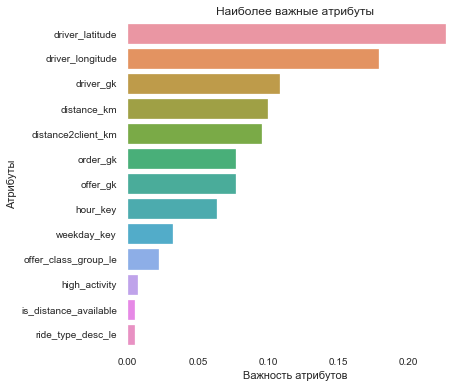

In [ ]:
headers = list(X_train.columns.values)

feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(6, 6))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title("Наиболее важные атрибуты")
plt.legend()
plt.show()

Посчитаем качество модели - **classification report**:

In [ ]:
from sklearn.metrics import classification_report

model_pred = model.predict(X_test)
print(classification_report(y_test, model_pred))
model.score(X_test, y_test)

              precision    recall  f1-score   support

           0       0.85      0.75      0.80     15178
           1       0.77      0.86      0.82     14720

    accuracy                           0.81     29898
   macro avg       0.81      0.81      0.81     29898
weighted avg       0.81      0.81      0.81     29898



0.8077128904943475

Средняя точность модели порядка 81%. В зависимости от ответа водителя точность модели в пределах от 77 % до 85 %.

#### 2. Нормируем датасет и обучаем.

In [ ]:
df

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,distance_km,driver_response,distance2client_km,is_distance_available,high_activity,offer_class_group_le,ride_type_desc_le
0,1105373,5,20,6080,174182,55.818842,37.334562,-1.000,0,1.363047,0,1,1,3
1,759733,5,14,6080,358774,55.805342,37.515023,18.802,1,3.413097,1,0,4,3
2,416977,6,14,6080,866260,55.813978,37.347688,6.747,0,0.410000,1,0,1,3
3,889660,2,6,6080,163522,55.745922,37.421748,-1.000,1,0.647473,0,0,1,3
4,1120055,4,16,6080,506710,55.803578,37.521602,12.383,1,1.062483,1,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,726210,0,2,2442,27360,55.961246,37.413497,17.378,0,0.621864,1,0,1,3
99996,881472,0,1,2442,381960,55.961246,37.413497,7.751,0,0.405427,1,0,1,3
99997,626673,1,20,2442,627126,55.961315,37.413497,46.983,0,0.204433,1,0,4,3
99998,672584,6,21,2442,140623,55.961354,37.413864,50.029,0,0.393915,1,1,1,3


In [ ]:
# Нормализуем данные, выделим целевое значение
from sklearn import preprocessing

X = df.drop(['driver_response'], axis = 1)
y = df['driver_response']

#Задаем максимум и минимум новой нормализованной выборки через feature_range
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))

# Запоминаем названия столбцов
headers = list(X.columns.values)

# Трансформируем регрессоры, масштабируя каждую переменную к указанному диапазону
# Получаем построчный numpy array
np_scaled = min_max_scaler.fit_transform(X)

# Преобразуем в DataFrame
X_norm = pd.DataFrame(np_scaled)

# Восстанавливаем названия столбцов
X_norm.columns = headers
X_norm.head()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,distance_km,distance2client_km,is_distance_available,high_activity,offer_class_group_le,ride_type_desc_le
0,0.977899,0.833333,0.869565,0.89311,0.189242,0.580306,0.269947,0.000000,0.115946,0.0,1.0,0.142857,1.0
1,0.672118,0.833333,0.608696,0.89311,0.389814,0.564357,0.409216,0.196847,0.290330,1.0,0.0,0.571429,1.0
2,0.368888,1.000000,0.608696,0.89311,0.941234,0.574559,0.280077,0.077011,0.034876,1.0,0.0,0.142857,1.0
3,0.787062,0.333333,0.260870,0.89311,0.177659,0.494159,0.337232,0.000000,0.055076,0.0,0.0,0.142857,1.0
4,0.990888,0.666667,0.695652,0.89311,0.550557,0.562273,0.414293,0.133037,0.090379,1.0,0.0,0.142857,1.0


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.3)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# создаем модель деревья решений
# выбираем 100 деревьев в качестве параметра
model=RandomForestClassifier(n_estimators=100)

# обучаем модель
model.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

No handles with labels found to put in legend.


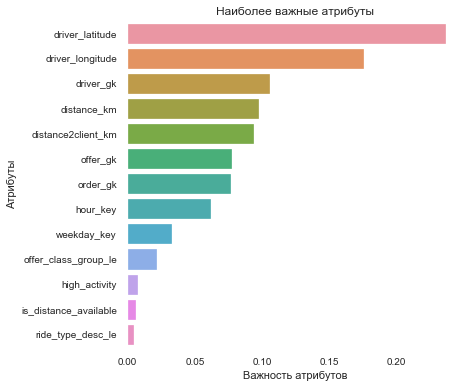

In [ ]:
headers = list(X_train.columns.values)

feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(6, 6))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title("Наиболее важные атрибуты")
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import classification_report

model_pred = model.predict(X_test)
print(classification_report(y_test, model_pred))
model.score(X_test, y_test)

              precision    recall  f1-score   support

           0       0.86      0.75      0.80     15253
           1       0.77      0.87      0.82     14645

    accuracy                           0.81     29898
   macro avg       0.81      0.81      0.81     29898
weighted avg       0.81      0.81      0.81     29898



0.8088166432537294

Средняя точность модели порядка 81%. В зависимости от ответа водителя точность модели в пределах от 77 % до 86 %.  
Нормировка существенно не влияет на нормировку.